<a href="https://colab.research.google.com/github/anupriyakhare34/IIMProject/blob/master/Customer_Reviews_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Exploratory Data Analysis of data set**

***--> Importing Libraries and reading dataset***

In [0]:
import numpy as np
import pandas as pd

In [0]:
#### For visualizations
import matplotlib.pyplot as plt

In [0]:
#### For regular expressions
import re

In [0]:
#### For handling string
import string

In [0]:
#### For performing mathematical operations
import math

In [0]:
#### Importing Dataset
df = pd.read_excel('capstone_airline_reviews3.xlsx')

In [9]:
#### Print shape of data
print ('Shape of Data', df.shape)
df.head()

Shape of Data (131895, 17)


,airline,overall,author,review_date,customer_review,aircraft,traveller_type,cabin,route,date_flown,seat_comfort,cabin_service,food_bev,entertainment,ground_service,value_for_money,recommended
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Turkish Airlines,7.0,Christopher Hackley,8th May 2019,âœ… Trip Verified | London to Izmir via Istanb...,NaN,Business,Economy Class,London to Izmir via Istanbul,2019-05-01 00:00:00,4.0,5.0,4.0,4.0,2.0,4.0,yes
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Turkish Airlines,2.0,Adriana Pisoi,7th May 2019,âœ… Trip Verified | Istanbul to Bucharest. We ...,NaN,Family Leisure,Economy Class,Istanbul to Bucharest,2019-05-01 00:00:00,4.0,1.0,1.0,1.0,1.0,1.0,no
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


***--> Since the first 5 rows show alternate blank rows, deleting all the rows where all elements are missing***

In [10]:
#### Drop the rows where all elements are missing
df_edited = df.dropna(how='all')
df_edited.shape

(65947, 17)

In [11]:
df_edited.head()

,airline,overall,author,review_date,customer_review,aircraft,traveller_type,cabin,route,date_flown,seat_comfort,cabin_service,food_bev,entertainment,ground_service,value_for_money,recommended
1,Turkish Airlines,7.0,Christopher Hackley,8th May 2019,âœ… Trip Verified | London to Izmir via Istanb...,NaN,Business,Economy Class,London to Izmir via Istanbul,2019-05-01 00:00:00,4.0,5.0,4.0,4.0,2.0,4.0,yes
3,Turkish Airlines,2.0,Adriana Pisoi,7th May 2019,âœ… Trip Verified | Istanbul to Bucharest. We ...,NaN,Family Leisure,Economy Class,Istanbul to Bucharest,2019-05-01 00:00:00,4.0,1.0,1.0,1.0,1.0,1.0,no
5,Turkish Airlines,3.0,M Galerko,7th May 2019,âœ… Trip Verified | Rome to Prishtina via Ista...,NaN,Business,Economy Class,Rome to Prishtina via Istanbul,2019-05-01 00:00:00,1.0,4.0,1.0,3.0,1.0,2.0,no
7,Turkish Airlines,10.0,Zeshan Shah,6th May 2019,âœ… Trip Verified | Flew on Turkish Airlines I...,A330,Solo Leisure,Economy Class,Washington Dulles to Karachi,April 2019,4.0,5.0,5.0,5.0,5.0,5.0,yes
9,Turkish Airlines,1.0,Pooja Jain,6th May 2019,âœ… Trip Verified | Mumbai to Dublin via Istan...,NaN,Solo Leisure,Economy Class,Mumbai to Dublin via Istanbul,2019-05-01 00:00:00,1.0,1.0,1.0,1.0,1.0,1.0,no


In [12]:
#### Check null values present in dataset
df_edited.isnull().sum()

airline                0
overall             1930
author                 0
review_date            0
customer_review        0
aircraft           46229
traveller_type     26192
cabin               2644
route              26221
date_flown         26314
seat_comfort        5266
cabin_service       5232
food_bev           13339
entertainment      21754
ground_service     26589
value_for_money     1972
recommended         1507
dtype: int64

In [13]:
#### Deleting Null Values from recommended Column and checking the count of null values once again
df_edited = df_edited.dropna(axis=0, subset=['recommended'])
df_edited.isnull().sum()

airline                0
overall             1910
author                 0
review_date            0
customer_review        0
aircraft           44723
traveller_type     24686
cabin               1138
route              24715
date_flown         24807
seat_comfort        3759
cabin_service       3725
food_bev           11832
entertainment      20247
ground_service     25082
value_for_money      465
recommended            0
dtype: int64

In [17]:
df_edited.shape

(64440, 17)

***--> The ‘recommended’ column contains values in the form of Yes-No so converting these columns to integers***

In [16]:
d = {'no': 0, 'yes': 1}
df_edited['recommended'] = df_edited['recommended'].map(d).fillna(df_edited['recommended'])
df_edited.head()

,airline,overall,author,review_date,customer_review,aircraft,traveller_type,cabin,route,date_flown,seat_comfort,cabin_service,food_bev,entertainment,ground_service,value_for_money,recommended
1,Turkish Airlines,7.0,Christopher Hackley,8th May 2019,âœ… Trip Verified | London to Izmir via Istanb...,NaN,Business,Economy Class,London to Izmir via Istanbul,2019-05-01 00:00:00,4.0,5.0,4.0,4.0,2.0,4.0,1.0
3,Turkish Airlines,2.0,Adriana Pisoi,7th May 2019,âœ… Trip Verified | Istanbul to Bucharest. We ...,NaN,Family Leisure,Economy Class,Istanbul to Bucharest,2019-05-01 00:00:00,4.0,1.0,1.0,1.0,1.0,1.0,0.0
5,Turkish Airlines,3.0,M Galerko,7th May 2019,âœ… Trip Verified | Rome to Prishtina via Ista...,NaN,Business,Economy Class,Rome to Prishtina via Istanbul,2019-05-01 00:00:00,1.0,4.0,1.0,3.0,1.0,2.0,0.0
7,Turkish Airlines,10.0,Zeshan Shah,6th May 2019,âœ… Trip Verified | Flew on Turkish Airlines I...,A330,Solo Leisure,Economy Class,Washington Dulles to Karachi,April 2019,4.0,5.0,5.0,5.0,5.0,5.0,1.0
9,Turkish Airlines,1.0,Pooja Jain,6th May 2019,âœ… Trip Verified | Mumbai to Dublin via Istan...,NaN,Solo Leisure,Economy Class,Mumbai to Dublin via Istanbul,2019-05-01 00:00:00,1.0,1.0,1.0,1.0,1.0,1.0,0.0


In [18]:
#### Find the count of airlines
print('Count of unique airlines =>',len(df_edited['airline'].unique()))

Count of unique airlines => 81


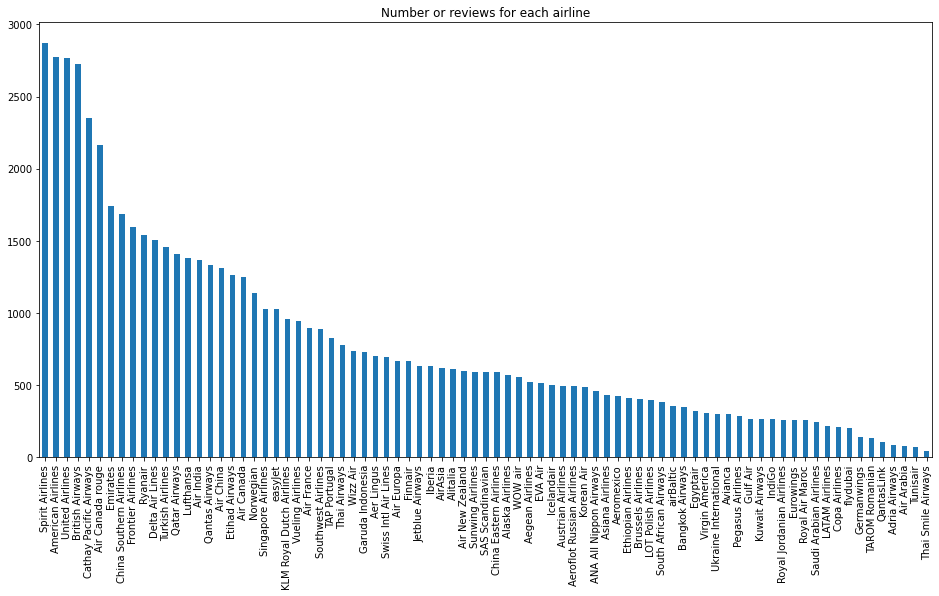

In [19]:
#### Plot graph to find the count of each airline
df_edited['airline'].value_counts().plot(kind='bar',
                                    figsize=(16,8),
                                    title="Number or reviews for each airline")

***--> We will review only those airlines which have more than 500 reviews***

Here, we will use lambda functions with filter() to filter our dataset.

In [20]:
#### Use lambda function to filter out the final data
df_final = df_edited.groupby('airline').filter(lambda x:len(x)>500).reset_index(drop=True)
print('Final count of unique airlines to be reviewed =>',len(df_final['airline'].unique()))

Final count of unique airlines to be reviewed => 47


***--> Exploring the final dataset***

In [21]:
#### Shape of Data
df_final.shape

(54726, 17)

In [22]:
#### First five rows of Data
df_final.head()

,airline,overall,author,review_date,customer_review,aircraft,traveller_type,cabin,route,date_flown,seat_comfort,cabin_service,food_bev,entertainment,ground_service,value_for_money,recommended
0,Turkish Airlines,7.0,Christopher Hackley,8th May 2019,âœ… Trip Verified | London to Izmir via Istanb...,NaN,Business,Economy Class,London to Izmir via Istanbul,2019-05-01 00:00:00,4.0,5.0,4.0,4.0,2.0,4.0,1.0
1,Turkish Airlines,2.0,Adriana Pisoi,7th May 2019,âœ… Trip Verified | Istanbul to Bucharest. We ...,NaN,Family Leisure,Economy Class,Istanbul to Bucharest,2019-05-01 00:00:00,4.0,1.0,1.0,1.0,1.0,1.0,0.0
2,Turkish Airlines,3.0,M Galerko,7th May 2019,âœ… Trip Verified | Rome to Prishtina via Ista...,NaN,Business,Economy Class,Rome to Prishtina via Istanbul,2019-05-01 00:00:00,1.0,4.0,1.0,3.0,1.0,2.0,0.0
3,Turkish Airlines,10.0,Zeshan Shah,6th May 2019,âœ… Trip Verified | Flew on Turkish Airlines I...,A330,Solo Leisure,Economy Class,Washington Dulles to Karachi,April 2019,4.0,5.0,5.0,5.0,5.0,5.0,1.0
4,Turkish Airlines,1.0,Pooja Jain,6th May 2019,âœ… Trip Verified | Mumbai to Dublin via Istan...,NaN,Solo Leisure,Economy Class,Mumbai to Dublin via Istanbul,2019-05-01 00:00:00,1.0,1.0,1.0,1.0,1.0,1.0,0.0


In [23]:
#### Overall Data
df_final

,airline,overall,author,review_date,customer_review,aircraft,traveller_type,cabin,route,date_flown,seat_comfort,cabin_service,food_bev,entertainment,ground_service,value_for_money,recommended
0,Turkish Airlines,7.0,Christopher Hackley,8th May 2019,âœ… Trip Verified | London to Izmir via Istanb...,NaN,Business,Economy Class,London to Izmir via Istanbul,2019-05-01 00:00:00,4.0,5.0,4.0,4.0,2.0,4.0,1.0
1,Turkish Airlines,2.0,Adriana Pisoi,7th May 2019,âœ… Trip Verified | Istanbul to Bucharest. We ...,NaN,Family Leisure,Economy Class,Istanbul to Bucharest,2019-05-01 00:00:00,4.0,1.0,1.0,1.0,1.0,1.0,0.0
2,Turkish Airlines,3.0,M Galerko,7th May 2019,âœ… Trip Verified | Rome to Prishtina via Ista...,NaN,Business,Economy Class,Rome to Prishtina via Istanbul,2019-05-01 00:00:00,1.0,4.0,1.0,3.0,1.0,2.0,0.0
3,Turkish Airlines,10.0,Zeshan Shah,6th May 2019,âœ… Trip Verified | Flew on Turkish Airlines I...,A330,Solo Leisure,Economy Class,Washington Dulles to Karachi,April 2019,4.0,5.0,5.0,5.0,5.0,5.0,1.0
4,Turkish Airlines,1.0,Pooja Jain,6th May 2019,âœ… Trip Verified | Mumbai to Dublin via Istan...,NaN,Solo Leisure,Economy Class,Mumbai to Dublin via Istanbul,2019-05-01 00:00:00,1.0,1.0,1.0,1.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54721,WOW air,10.0,Mike Causer,21st March 2013,Flew London Gatwick - Reykjavik return on 15/1...,NaN,NaN,Economy Class,NaN,NaN,4.0,4.0,4.0,NaN,NaN,5.0,1.0
54722,WOW air,6.0,Halldorsson Sigmundur,24th January 2013,Flew with this new entrant to the Icelandic ma...,NaN,NaN,Economy Class,NaN,NaN,4.0,4.0,NaN,NaN,NaN,3.0,1.0
54723,WOW air,9.0,N Holdsworth,10th January 2013,Second time on WOW LGW to KEF 21st December. S...,NaN,NaN,Economy Class,NaN,NaN,5.0,5.0,5.0,NaN,NaN,4.0,1.0
54724,WOW air,9.0,Michael Shoesmith,23rd December 2012,7th December 2012 LGW-KEF. Iceland Express and...,NaN,NaN,Economy Class,NaN,NaN,4.0,3.0,4.0,NaN,NaN,4.0,1.0


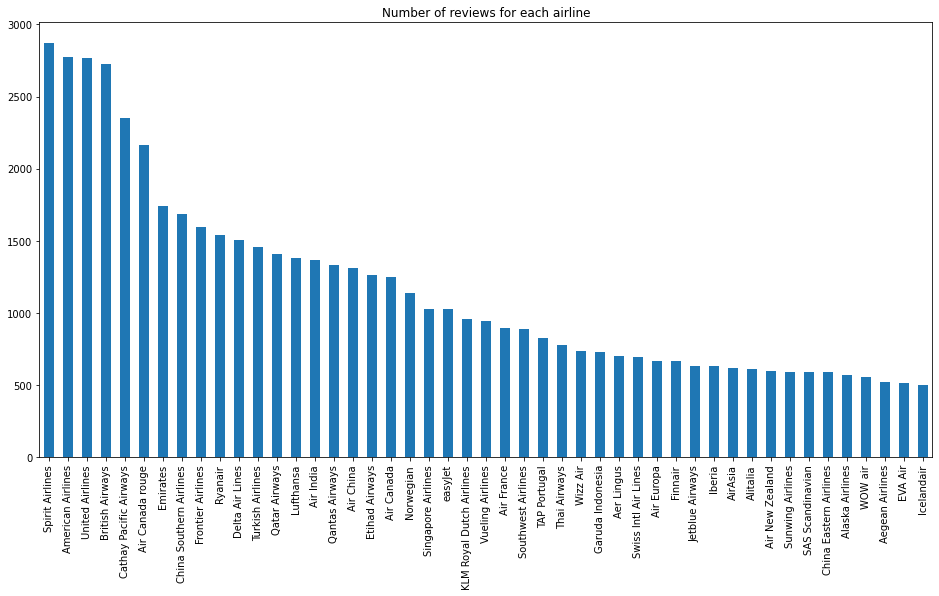

In [24]:
#### Number of Reviews for each airline
df_final['airline'].value_counts().plot(kind='bar',
                                    figsize=(16,8),
                                    title="Number of reviews for each airline")

In [25]:
df_final['airline'].value_counts()

Spirit Airlines             2870
American Airlines           2776
United Airlines             2770
British Airways             2723
Cathay Pacific Airways      2352
Air Canada rouge            2162
Emirates                    1739
China Southern Airlines     1689
Frontier Airlines           1597
Ryanair                     1543
Delta Air Lines             1504
Turkish Airlines            1457
Qatar Airways               1407
Lufthansa                   1381
Air India                   1366
Qantas Airways              1334
Air China                   1314
Etihad Airways              1264
Air Canada                  1250
Norwegian                   1137
Singapore Airlines          1030
easyJet                     1028
KLM Royal Dutch Airlines     957
Vueling Airlines             945
Air France                   899
Southwest Airlines           892
TAP Portugal                 829
Thai Airways                 780
Wizz Air                     736
Garuda Indonesia             733
Aer Lingus

**Cleaning Text Data in Python**

In [26]:
#### Take a look at some reviews
for index,text in enumerate(df_final['customer_review'][35:40]):
  print('Review %d:\n'%(index+1),text)

Review 1:
 âœ… Trip Verified | Venice to Ankara via Istanbul. Instead of taking off on time the fight was originally delayed (on the information table was written 10 minutes). I was satisfied with the information (it is possible to be delayed). The next information which followed invited us to go to the gate. More than 75% of passengers created the line in front of the desk and we were waiting for opening the gate. It was the first mistake, after 45 minutes the staff changed the departure time on the information desk for 10.50 a.m. Nobody knew that the game was started. The plane was delayed by more than 60 minutes. It is usually that the staff will give you any additional information about the connection flights. Unfortunately, it is not the case of Turkish Airlines . After the arrival, I run from the plane through the tunnel in the terminal and hoped to catch the flight to Ankara. The guy who was wearing the TA uniform and who was waiting at the end of the tunnel showed me the direct

***--> Expand Contractions***

Contractions are the shortened versions of words like don’t for do not and how’ll for how will. These are used to reduce the speaking and writing time of words. We need to expand these contractions for a better analysis of the reviews.

We have used a dictionary of common English contractions that we will use for mapping the contractions to their expanded forms

In [0]:
# Dictionary of English Contractions
contractions_dict = { "ain't": "are not","'s":" is","aren't": "are not",
                     "can't": "cannot","can't've": "cannot have",
                     "'cause": "because","could've": "could have","couldn't": "could not",
                     "couldn't've": "could not have", "didn't": "did not","doesn't": "does not",
                     "don't": "do not","hadn't": "had not","hadn't've": "had not have",
                     "hasn't": "has not","haven't": "have not","he'd": "he would",
                     "he'd've": "he would have","he'll": "he will", "he'll've": "he will have",
                     "how'd": "how did","how'd'y": "how do you","how'll": "how will",
                     "I'd": "I would", "I'd've": "I would have","I'll": "I will",
                     "I'll've": "I will have","I'm": "I am","I've": "I have", "isn't": "is not",
                     "it'd": "it would","it'd've": "it would have","it'll": "it will",
                     "it'll've": "it will have", "let's": "let us","ma'am": "madam",
                     "mayn't": "may not","might've": "might have","mightn't": "might not", 
                     "mightn't've": "might not have","must've": "must have","mustn't": "must not",
                     "mustn't've": "must not have", "needn't": "need not",
                     "needn't've": "need not have","o'clock": "of the clock","oughtn't": "ought not",
                     "oughtn't've": "ought not have","shan't": "shall not","sha'n't": "shall not",
                     "shan't've": "shall not have","she'd": "she would","she'd've": "she would have",
                     "she'll": "she will", "she'll've": "she will have","should've": "should have",
                     "shouldn't": "should not", "shouldn't've": "should not have","so've": "so have",
                     "that'd": "that would","that'd've": "that would have", "there'd": "there would",
                     "there'd've": "there would have", "they'd": "they would",
                     "they'd've": "they would have","they'll": "they will",
                     "they'll've": "they will have", "they're": "they are","they've": "they have",
                     "to've": "to have","wasn't": "was not","we'd": "we would",
                     "we'd've": "we would have","we'll": "we will","we'll've": "we will have",
                     "we're": "we are","we've": "we have", "weren't": "were not","what'll": "what will",
                     "what'll've": "what will have","what're": "what are", "what've": "what have",
                     "when've": "when have","where'd": "where did", "where've": "where have",
                     "who'll": "who will","who'll've": "who will have","who've": "who have",
                     "why've": "why have","will've": "will have","won't": "will not",
                     "won't've": "will not have", "would've": "would have","wouldn't": "would not",
                     "wouldn't've": "would not have","y'all": "you all", "y'all'd": "you all would",
                     "y'all'd've": "you all would have","y'all're": "you all are",
                     "y'all've": "you all have", "you'd": "you would","you'd've": "you would have",
                     "you'll": "you will","you'll've": "you will have", "you're": "you are",
                     "you've": "you have"}

In [0]:
#### Regular expression for finding contractions
contractions_re=re.compile('(%s)' % '|'.join(contractions_dict.keys()))

In [0]:
#### Function for expanding contractions
def expand_contractions(text,contractions_dict=contractions_dict):
  def replace(match):
    return contractions_dict[match.group(0)]
  return contractions_re.sub(replace, text)

In [0]:
#### Expanding Contractions in the reviews
df_final['customer_review']=df_final['customer_review'].apply(lambda x:expand_contractions(x))

Here, the expand_contractions function uses regular expressions to map the contractions in the text to their expanded forms from the dictionary.

***--> Lowercase the reviews***

In [0]:
#### Covert Text to lowercase
df_final['cleaned']=df_final['customer_review'].apply(lambda x: x.lower())

***--> Remove digits and words containing digits***

In [0]:
df_final['cleaned'] = df_final['cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x))

***--> Remove Punctuations***

In [0]:
#### string.punctuations function contains all the punctuations and we use regular expressions to search them in the text and remove them
df_final['cleaned'] = df_final['cleaned'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))

In [0]:
#### Removing extra spaces
df_final['cleaned'] = df_final['cleaned'].apply(lambda x: re.sub(' +',' ',x))

***--> Look how our text appears after cleaning***

In [35]:
for index,text in enumerate(df_final['cleaned'][35:40]):
  print('Review %d:\n'%(index+1),text)

Review 1:
 âœ… trip verified venice to ankara via istanbul instead of taking off on time the fight was originally delayed on the information table was written minutes i was satisfied with the information it is possible to be delayed the next information which followed invited us to go to the gate more than of passengers created the line in front of the desk and we were waiting for opening the gate it was the first mistake after minutes the staff changed the departure time on the information desk for am nobody knew that the game was started the plane was delayed by more than minutes it is usually that the staff will give you any additional information about the connection flights unfortunately it is not the case of turkish airlines after the arrival i run from the plane through the tunnel in the terminal and hoped to catch the flight to ankara the guy who was wearing the ta uniform and who was waiting at the end of the tunnel showed me the direction where i should have found the gate of

**Preparing Text Data for Exploratory Data Analysis (EDA)**

In this section, we’ll create a Document Term Matrix that we’ll later use in our analysis.

In this section, we’ll do the following things:

*   Stopwords Removal
*   Lemmatization


*   Create Document Term Matrix



In [0]:
#### Importing spacy
import spacy

In [0]:
#### Loading model
nlp = spacy.load('en_core_web_sm',disable=['parser', 'ner'])

In [0]:
#### Lemmatization with stopwords removal
df_final['lemmatized'] = df_final['cleaned'].apply(lambda x: ' '.join([token.lemma_ for token in list(nlp(x)) if (token.is_stop==False)]))

In [41]:
#### Group the lemmatized reviews according to the airlines
df_grouped = df_final[['airline','lemmatized']].groupby(by='airline').agg(lambda x:' '.join(x))
df_grouped.head()

,lemmatized
airline,
Aegean Airlines,âœ … trip verify athens london heathrow gold m...
Aer Lingus,verify dublin london flight book stop airline ...
Air Canada,âœ … trip verify boston toronto flight day tor...
Air Canada rouge,âœ … trip verify toronto moncton girlfriend la...
Air China,âœ … trip verify san francisco mumbai beijing ...


In [42]:
#### Overall grouped dataset
df_grouped

,lemmatized
airline,
Aegean Airlines,âœ … trip verify athens london heathrow gold m...
Aer Lingus,verify dublin london flight book stop airline ...
Air Canada,âœ … trip verify boston toronto flight day tor...
Air Canada rouge,âœ … trip verify toronto moncton girlfriend la...
Air China,âœ … trip verify san francisco mumbai beijing ...
Air Europa,âœ … trip verify madrid paris bad experience d...
Air France,âœ … trip verify checkin start half hour takeo...
Air India,âœ … trip verify good flight air india able up...
Air New Zealand,âœ … trip verify auckland melbourne sell loung...


***--> Create Document Term Matrix***

In [43]:
#### Create Document Term Matrix
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(analyzer='word')
data=cv.fit_transform(df_grouped['lemmatized'])
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index=df_grouped.index
df_dtm.head()

,aa,aaa,aaaaahhhh,aaadvantage,aaair,aaba,aabranded,aaccess,aacom,aacx,aadmiral,aadmirals,aadvantage,aaflight,aair,aairline,aal,aalborg,aalcph,aalesund,aalpmi,aan,aankomst,aantorini,aaoneworld,aar,aarabic,aareally,aargda,aarhus,aas,aaunited,aaus,aausair,aavacation,aavacations,aax,aaâ,ab,ababa,...,œwaterlandingâ,œwe,œweather,œweatherrelated,œweatherâ,œwelcome,œwelcomingâ,œwell,œwestern,œweâ,œwhat,œwhateverâ,œwheelchair,œwhen,œwhere,œwhich,œwhoa,œwhy,œwhyâ,œwill,œwillkomman,œwith,œwrongâ,œye,œyeah,œyesâ,œyou,œyour,œyouâ,œzesty,œzoneâ,œæœ,œï¼œçµ,šå,šå¾ˆå,šæ,šæˆ²,šé,ƒæ,ƒçš
airline,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Aegean Airlines,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Aer Lingus,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Air Canada,4,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
Air Canada rouge,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Air China,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0


**Exploratory Data Analysis on Customer Reviews for Various Airlines using Python**

We will start by looking at the common words present in the reviews for each airline. For this, we will use the document term matrix created earlier with word clouds for plotting these words.

In [0]:
#### Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
from wordcloud import  WordCloud
from textwrap import wrap

In [0]:
#### Function for generating word clouds
def generate_wordcloud(data,title):
  wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
  plt.figure(figsize=(10,8))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)),fontsize=13)
  plt.show()

In [0]:
# Transposing document term matrix
df_dtm=df_dtm.transpose()

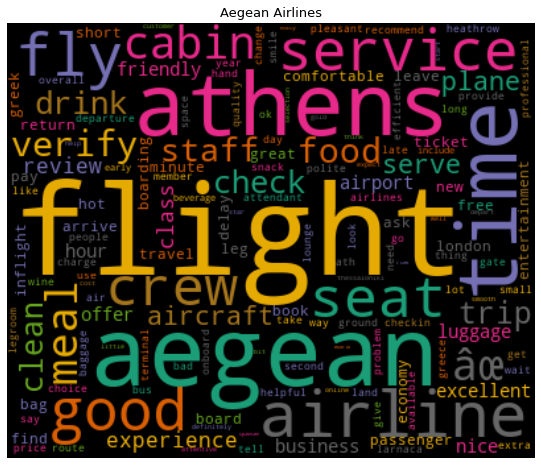

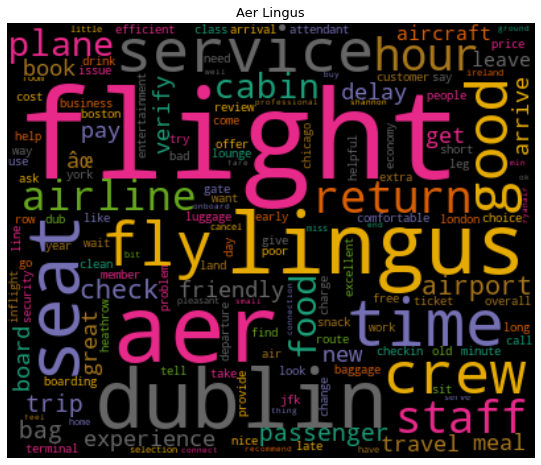

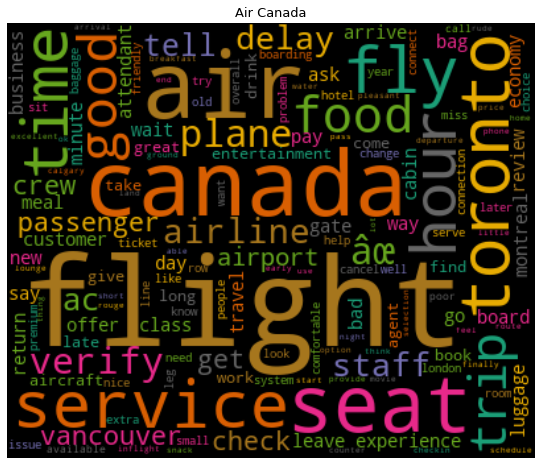

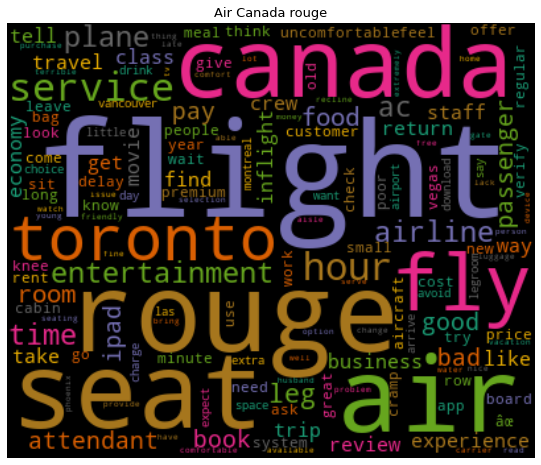

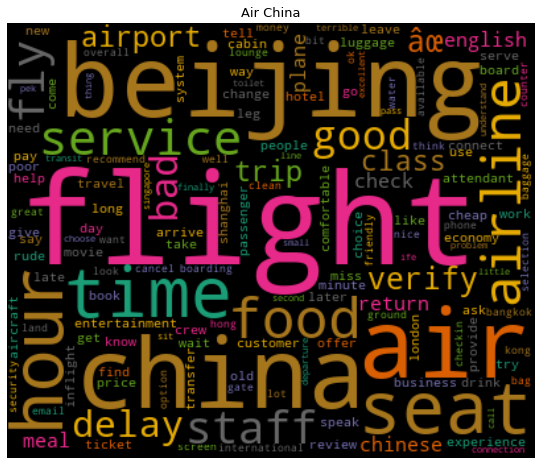

...

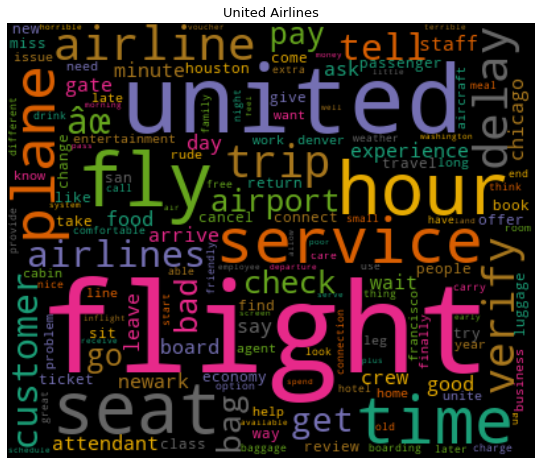

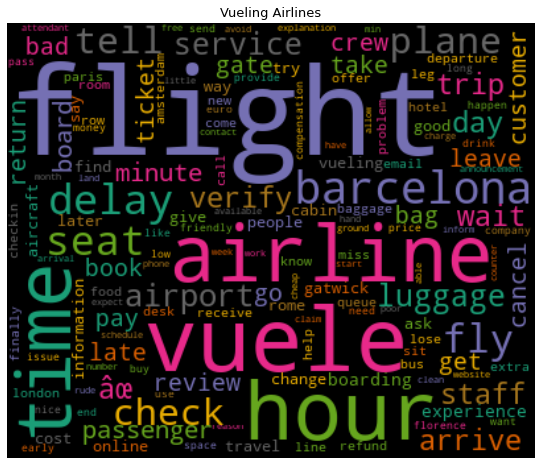

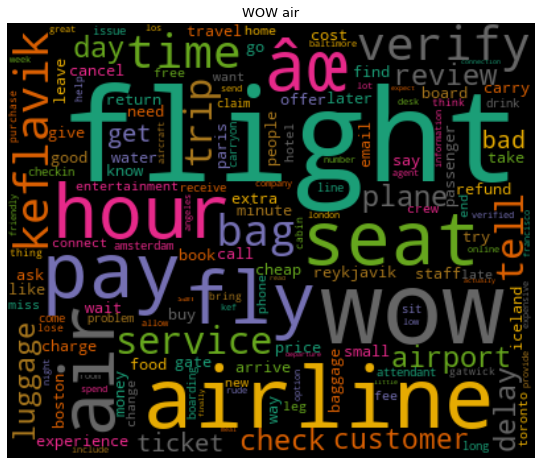

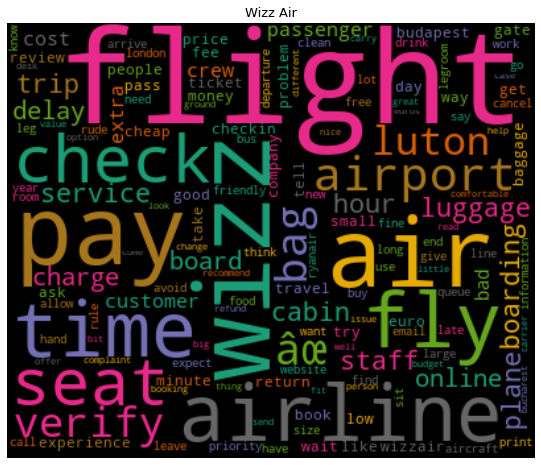

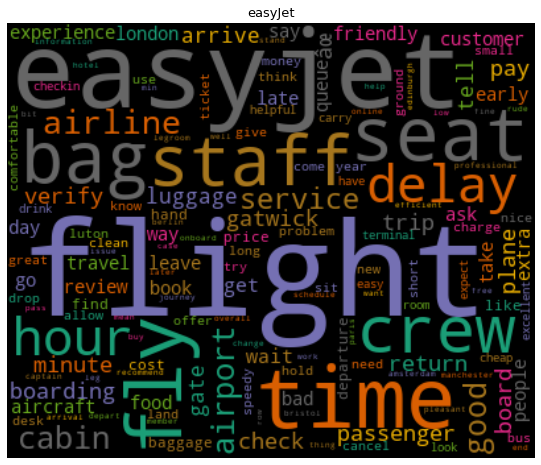

In [47]:
# Plotting word cloud for each airline
for index,airline in enumerate(df_dtm.columns):
  generate_wordcloud(df_dtm[airline].sort_values(ascending=False),airline)

***--> Checking the polarity, i.e., how much a text is positive or negative***

In [0]:
#### Importing Text Blob for checking the polarity
from textblob import TextBlob

In [0]:
#### Check polarity of a review
df_final['polarity'] = df_final['lemmatized'].apply(lambda x:TextBlob(x).sentiment.polarity)

In [50]:
#### Some of the most positive reviews from the customers
print('3 Random Reviews with Highest Polarity:')
for index,review in enumerate(df_final.iloc[df_final['polarity'].sort_values(ascending=False)[:3].index]['customer_review']):
  print('Review {}:\n'.format(index+1),review)

3 Random Reviews with Highest Polarity:
Review 1:
 My family and I used GA for CGK-HKG-CGK 26-31 August 2013. FA is were very helpful and polite with our 2 children. Immaculate cabin. On time. Improvements needed for inflight entertainment. Generally excellent service.
Review 2:
 Before I went to the airport I checked my Sunwing flight online and it was supposed to be on time. All other flights were on time but flight WG622 to Cuba on January 16. Weather that day was perfect sunny and no snow for days. Sunwing did not warn people about the delay and there was no reason for the delay! It is my fifth time to Cuba by Sunwing.
Review 3:
 On Tuesday 16 December our flight from Reykjavik was cancelled. The flight was due to leave around 14.55 by 17.00 we were in a hotel meal by 20.00. We were kept informed by the hotel staff who were very helpful helping people to print boarding passes. Whilst this delay caused us some inconvenience it was very understandable delay. I have been very impresse

In [51]:
#### Some of the most negative reviews from the customers
print("3 Random Reviews with Lowest Polarity:")
for index,review in enumerate(df_final.iloc[df_final['polarity'].sort_values(ascending=True)[:3].index]['customer_review']):
  print('Review {}:\n'.format(index+1),review)

3 Random Reviews with Lowest Polarity:
Review 1:
 Flew Jeddah-Istanbul-Dublin December 2013 and returned by reverse route January 2014. Business class is a joke. Seats and legroom shocking on both Jeddah Istanbul legs and no inflight entertainment. Disgraceful when compared to alternative carriers. Customer service via website also dreadful.
Review 2:
 Travelled with my 2 sons ages 4 and 7. Had ordered 2 children is meals and found out at service their meals were not on board. Due to being delayed my son is went 8 hours without a meal and I had to feed them chocolate throughout the flight. Also the inflight entertainment did not show one children is movie. Awful customer service, they will not let me talk to a manager or Senior member of staff and have forced a travel voucher upon me I did not wish to accept.
Review 3:
 Terrible customer service. I purchased tickets for my employees to take a trip in October 2011 and one of the employees can no longer go. This trip has been planned 5 m

***--> Let’s plot polarities of reviews for each airline and compare them***

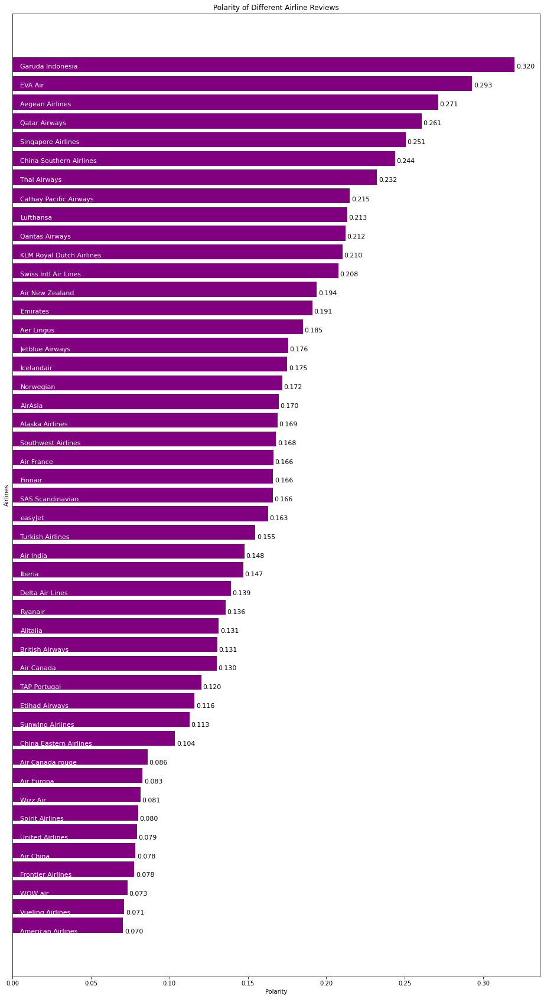

In [52]:
airline_polarity_sorted = pd.DataFrame(df_final.groupby('airline')['polarity'].mean().sort_values(ascending=True))

plt.figure(figsize=(16,30))
plt.xlabel('Polarity')
plt.ylabel('Airlines')
plt.title('Polarity of Different Airline Reviews')
polarity_graph=plt.barh(np.arange(len(airline_polarity_sorted.index)),airline_polarity_sorted['polarity'],color='purple',)

#### Writing names of airines on bar
for bar, airline in zip(polarity_graph, airline_polarity_sorted.index):
  plt.text(0.005, bar.get_y()+bar.get_width(),'{}'.format(airline),va='center',fontsize=11,color='white')

#### Writing polarity values on graph
for bar, polarity in zip(polarity_graph, airline_polarity_sorted['polarity']):
  plt.text(bar.get_width()+0.001, bar.get_y()+bar.get_width(),'%.3f'%polarity, va = 'center', fontsize=11, color='black')

plt.yticks([])
plt.show()

***--> Let’s also take a look at the number of reviewers who recommended a particular airline. For this, we can take the percentage of reviewers and plot that***

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

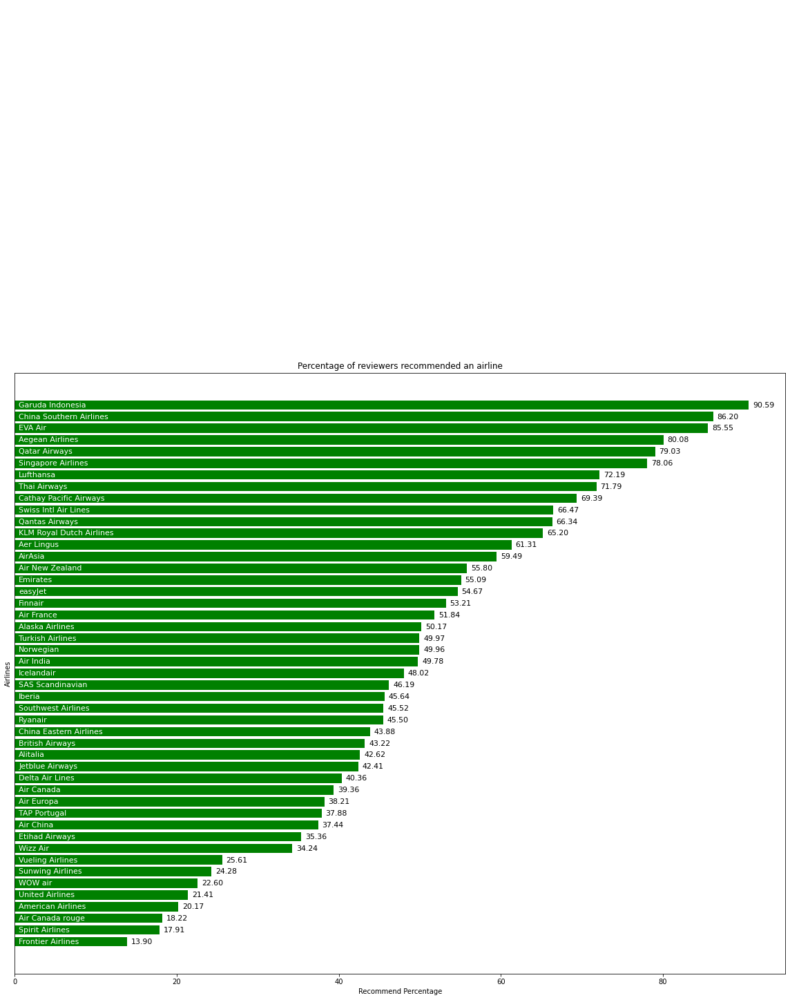

In [60]:
recommend_percentage=pd.DataFrame(((df_final.groupby('airline')['recommended'].sum()*100)/df.groupby('airline')['recommended'].count()).sort_values(ascending=True))

plt.figure(figsize=(20,16))
plt.xlabel('Recommend Percentage')
plt.ylabel('Airlines')
plt.title('Percentage of reviewers recommended an airline')
recommend_graph=plt.barh(np.arange(len(recommend_percentage.index)),recommend_percentage['recommended'],color='green')

# Writing product names on bar
for bar,airline in zip(recommend_graph,recommend_percentage.index):
  plt.text(0.5,bar.get_y()+0.4,'{}'.format(airline),va='center',fontsize=11,color='white')

# Writing recommendation percentage on graph
for bar,percentage in zip(recommend_graph,recommend_percentage['recommended']):
  plt.text(bar.get_width()+0.5,bar.get_y()+0.4,'%.2f'%percentage,va='center',fontsize=11,color='black')

plt.yticks([])
plt.show()

From the plot above we can see that the polaritiy of the reviews for Garuda Indonesia airlines is with highest polarity and so is it's recommendation percentage. Similarly we can see that the airlines with lower polarity of reviews have lower recommendation percentage.

So, we can say that the polarity of reviews affects the chances of an airline getting recommended.

**Conclusion from the EDA on the Data Set**

1. Most customers look for seat comfort, cabin service, food and beverages, entertainment, ground service, punctuality and value for money while reviewing a flight. 

2. Garuda Indonesia has most positive reviews and is the most recommended airline.